# Financial Econometrics I - Homework 3
#### **Authors:** Maxim Milde (`73267075`), Zahid Pashayev (`54520099`)
**Individual contributions**: Maxim Milde (), Zahid Pashayev (); cross-revision, refinement and elaboration by both students on all parts.

**AI tool usage**: Claude.ai was used for coding assistance (syntax - if not found in the seminars, debugging, R package usage) and as a discussion partner for improvement of concept understanding. All interpretation, reasoning, and written analysis is fully composed by the students.

**Data used**: `73267075`

---

In [367]:
#packages
library(fst)
library(highfrequency)
library(xts)
library(rugarch)

Loading required package: parallel



## Problem 1

### 0. Data Preparation

In [16]:
#load timeframe
periods <- read.csv("students_HW3/73267075_periods_HW_3.csv")
periods

X,Ticker,Start,End
<int>,<chr>,<int>,<int>
1,MSFT,2013,2015
2,BAC,2015,2016
3,XOM,2010,2015


In [ ]:
#func to extract periods
get_period <- function(ticker){
    row <- periods[periods$Ticker==ticker, ]
    list(start=paste0(row$Start, "-01-01"), #returns start and end
        end=paste0(row$End, "-12-31"))
}

In [72]:
#setwd()

#load stocks
BAC <- read_fst("HW_3_data/HW_3_BAC_1min.fst")
MSFT <- read_fst("HW_3_data/HW_3_MSFT_1min.fst")
XOM <- read_fst("HW_3_data/HW_3_XOM_1min.fst")

head(BAC)
str(BAC)
str(MSFT)
str(XOM)

,index,V1
,<dttm>,<dbl>
1,2010-01-04 07:00:00,14.0864
2,2010-01-04 07:04:00,14.0864
3,2010-01-04 07:06:00,14.0679
4,2010-01-04 07:08:00,14.0586
5,2010-01-04 07:13:00,14.0772
6,2010-01-04 07:21:00,14.1050


'data.frame':	1134050 obs. of  2 variables:
 $ index: POSIXct, format: "2010-01-04 07:00:00" "2010-01-04 07:04:00" ...
 $ V1   : num  14.1 14.1 14.1 14.1 14.1 ...
'data.frame':	933337 obs. of  2 variables:
 $ index: POSIXct, format: "2010-01-04 07:44:00" "2010-01-04 07:56:00" ...
 $ V1   : num  24.7 24.7 24.7 24.6 24.6 ...
'data.frame':	882799 obs. of  2 variables:
 $ index: POSIXct, format: "2010-01-04 07:01:00" "2010-01-04 07:02:00" ...
 $ V1   : num  52.7 52.7 52.7 52.6 52.7 ...


In [75]:
#convert stock dfs to xts
BAC_xts <- xts(BAC$V1, order.by=BAC$index)
MSFT_xts <- xts(MSFT$V1, order.by=MSFT$index)
XOM_xts <- xts(XOM$V1, order.by=XOM$index)


#filter to our given periods
p_BAC <- get_period("BAC")
p_MSFT <- get_period("MSFT")
p_XOM <- get_period("XOM")

BAC_xts <- BAC_xts[paste0(p_BAC$start, "/", p_BAC$end)] #xts subsetting
MSFT_xts <- MSFT_xts[paste0(p_MSFT$start, "/", p_MSFT$end)]
XOM_xts <- XOM_xts[paste0(p_XOM$start, "/", p_XOM$end)]


#filter hours of interest
BAC_xts <- BAC_xts[format(index(BAC_xts), "%H:%M:%S") >= "07:00:00" &
                   format(index(BAC_xts), "%H:%M:%S") <= "18:00:00"]
MSFT_xts <- MSFT_xts[format(index(MSFT_xts), "%H:%M:%S") >= "07:00:00" &
                     format(index(MSFT_xts), "%H:%M:%S") <= "18:00:00"]
XOM_xts <- XOM_xts[format(index(XOM_xts), "%H:%M:%S") >= "07:00:00" &
                   format(index(XOM_xts), "%H:%M:%S") <= "18:00:00"]


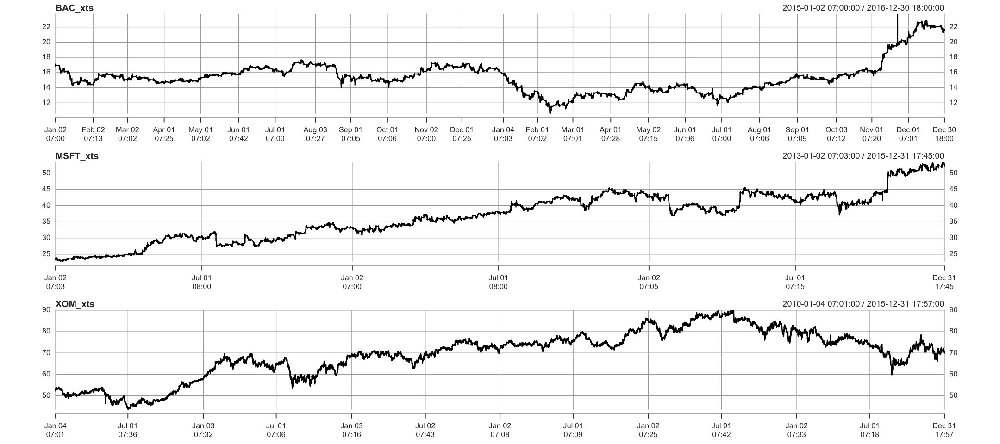

In [76]:
#plot prices
options(repr.plot.height=8, repr.plot.width=18)
par(mfrow=c(3,1))
plot.xts(BAC_xts)
plot.xts(MSFT_xts)
plot.xts(XOM_xts)

Abnormal spike in BAC's price.

In [77]:
to.daily(BAC_xts)["2016-11-17/2016-11-28"] #check OHLC around the suspicious period

           BAC_xts.Open BAC_xts.High BAC_xts.Low BAC_xts.Close
2016-11-17      19.1140      19.6684     19.0264       19.5906
2016-11-18      19.5031      19.6295     19.3426       19.4544
2016-11-21      19.5517      19.7852     19.4544       19.7463
2016-11-22      19.8144      23.7344     19.5712       19.7754
2016-11-23      19.7463      20.0964     19.6684       20.0283
2016-11-25      20.0381      20.3299     19.9505       20.3007
2016-11-28      20.1062      20.2618     19.6976       19.7463

In [78]:
BAC_xts["2016-11-22"][BAC_xts["2016-11-22"] > 19.9] #check the highest values on that day

Warning message:
"object timezone ('UTC') is different from system timezone ('')"


                       [,1]
2016-11-22 09:05:00 23.7344
2016-11-22 09:43:00 19.9019
2016-11-22 09:44:00 19.9009

Note timestamp.

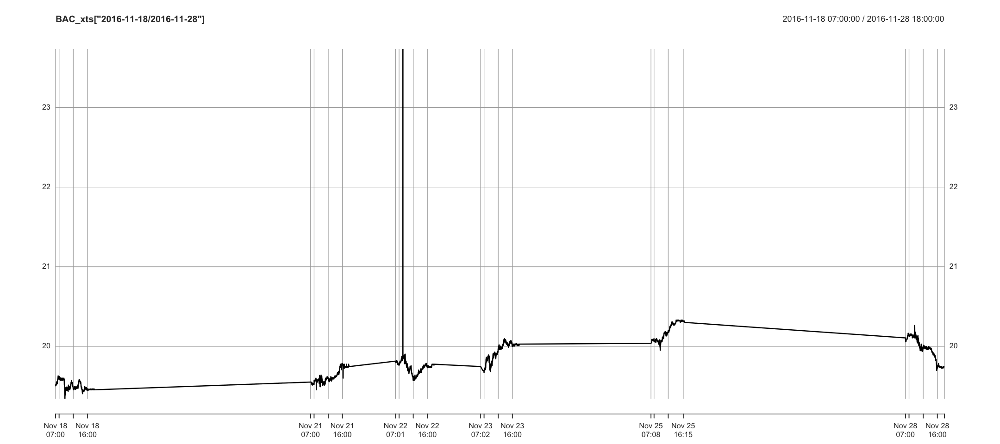

In [79]:
plot.xts(BAC_xts["2016-11-18/2016-11-28"]) 

This ~20% 1-minute price increase appears to be a data error as the surrounding it OHLC prices remain around $19.5-$19.8. The economic mechanics behind such a trade also appear unrealistic (very large buy-sell trades within the same minute that return the price directly to its previous level). The anomaly can be clearly seen in the graph above.

As such, this observation will be removed.

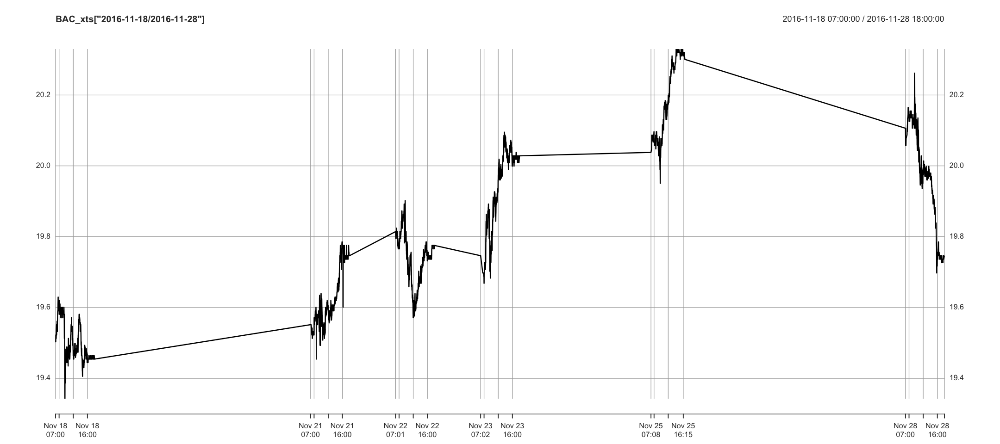

In [82]:
BAC_xts <- BAC_xts[index(BAC_xts)!=as.POSIXct("2016-11-22 09:05:00", tz="UTC")]
plot.xts(BAC_xts["2016-11-18/2016-11-28"]) 


Fixed.

In [83]:
summary(BAC_xts)
summary(MSFT_xts)
summary(XOM_xts)

     Index                        BAC_xts     
 Min.   :2015-01-02 07:00:00   Min.   :10.57  
 1st Qu.:2015-07-06 10:02:45   1st Qu.:14.14  
 Median :2016-01-05 09:03:30   Median :15.24  
 Mean   :2016-01-02 02:18:08   Mean   :15.39  
 3rd Qu.:2016-06-30 12:27:15   3rd Qu.:16.32  
 Max.   :2016-12-30 18:00:00   Max.   :22.85  

     Index                        MSFT_xts    
 Min.   :2013-01-02 07:03:00   Min.   :22.73  
 1st Qu.:2013-09-30 16:03:30   1st Qu.:30.73  
 Median :2014-07-03 12:53:30   Median :37.68  
 Mean   :2014-07-03 17:44:57   Mean   :36.73  
 3rd Qu.:2015-04-07 15:17:45   3rd Qu.:42.34  
 Max.   :2015-12-31 17:45:00   Max.   :53.42  

     Index                        XOM_xts     
 Min.   :2010-01-04 07:01:00   Min.   :43.45  
 1st Qu.:2011-06-09 15:15:30   1st Qu.:63.49  
 Median :2012-12-05 11:50:00   Median :71.43  
 Mean   :2012-12-19 00:05:58   Mean   :69.21  
 3rd Qu.:2014-07-03 15:02:30   3rd Qu.:76.54  
 Max.   :2015-12-31 17:57:00   Max.   :90.13  

### 1. Intraday 1-minute returns

When we use the abbreviation "RV" in this notebook, we mean Realized Variance.

In [100]:
BAC_ret <- do.call(rbind, lapply(
    split(BAC_xts, as.Date(index(BAC_xts))), #split on per-day basis
    function(intraday){diff(log(intraday))}))  #calculate returns within a day

MSFT_ret <- do.call(rbind, lapply(
    split(MSFT_xts, as.Date(index(MSFT_xts))),
    function(intraday){diff(log(intraday))}))

XOM_ret <- do.call(rbind, lapply(
    split(XOM_xts, as.Date(index(XOM_xts))),
    function(intraday){diff(log(intraday))}))

#convert back to xts
BAC_ret <- as.xts(BAC_ret)
MSFT_ret <- as.xts(MSFT_ret)
XOM_ret <- as.xts(XOM_ret)

head(BAC_ret)


Warning message:
"object timezone ('UTC') is different from system timezone ('')"


                             [,1]
2015-01-02 07:02:00  0.0000000000
2015-01-02 07:03:00  0.0000000000
2015-01-02 07:07:00  0.0016710107
2015-01-02 07:12:00 -0.0011136968
2015-01-02 07:18:00  0.0000000000
2015-01-02 07:19:00 -0.0005573139

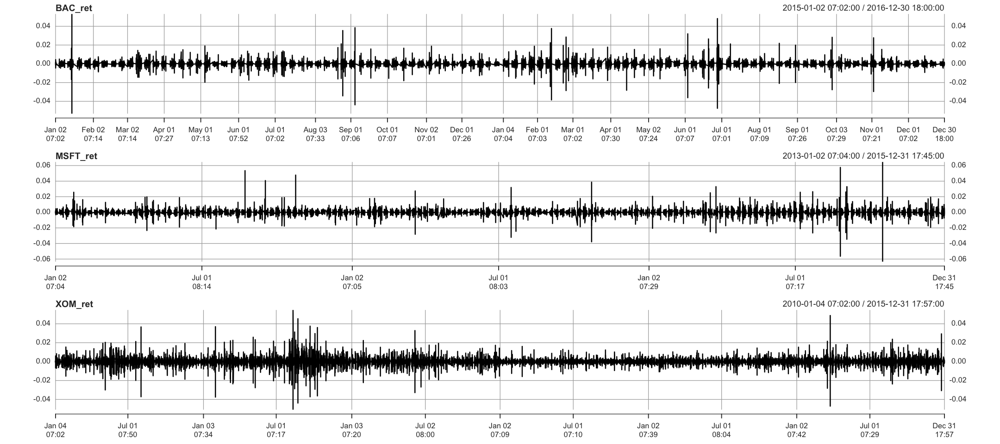

In [ ]:
par(mfrow=c(3,1)) #log returns for each stock
plot.xts(BAC_ret)
plot.xts(MSFT_ret)
plot.xts(XOM_ret)

Volatility clustering as expected. Memory appears more pronounced in XOM. Plot for visualization purposes.

### 2. Realized Variance: highfrequency package comparison

In [ ]:
#RV from prices, makeReturns=TRUE -> overnight returns are actually not included
#rCov computes returns on per.day-basis
BAC_price_RV <- rCov(BAC_xts, makeReturns=TRUE)
MSFT_price_RV <- rCov(MSFT_xts, makeReturns=TRUE)
XOM_price_RV <- rCov(XOM_xts, makeReturns=TRUE)

#RV from log returns, makeReturns=FALSE -> overnight returns are excluded
BAC_ret_RV <- rCov(BAC_ret, makeReturns=FALSE)
MSFT_ret_RV <- rCov(MSFT_ret, makeReturns=FALSE)
XOM_ret_RV <- rCov(XOM_ret, makeReturns=FALSE)

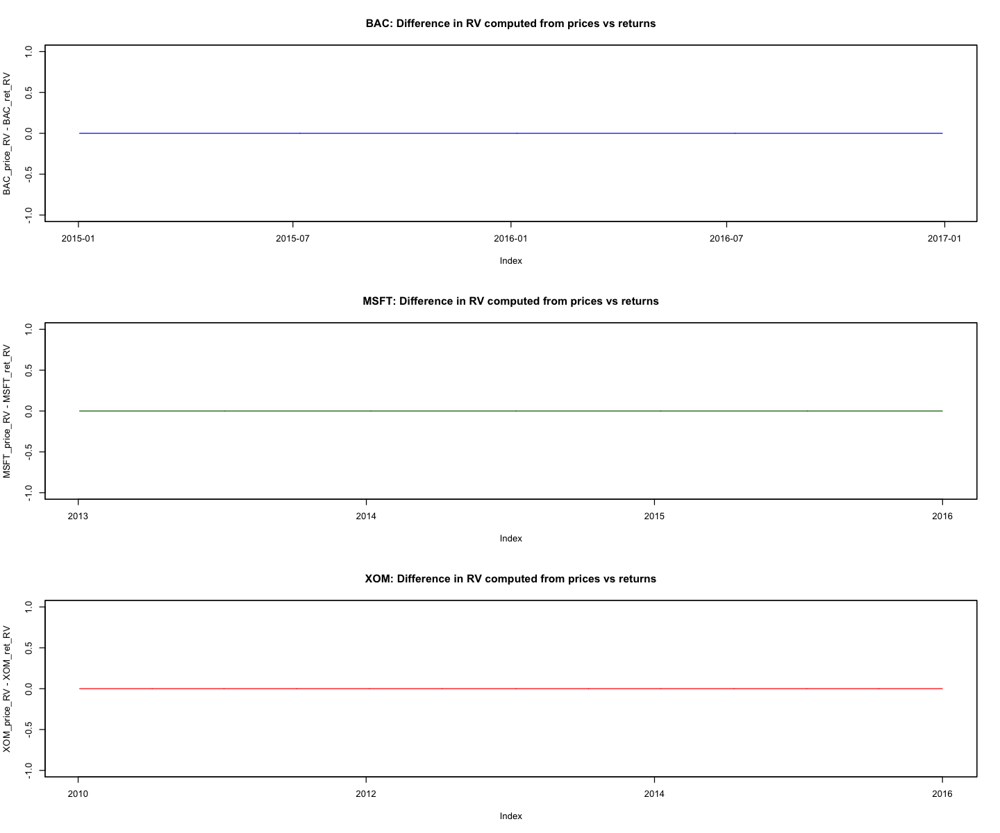

In [248]:
options(repr.plot.height=10, repr.plot.width=12)
par(mfrow=c(3,1))
plot.zoo(BAC_price_RV-BAC_ret_RV, main="BAC: Difference in RV computed from prices vs returns", col="blue")
plot.zoo(MSFT_price_RV-MSFT_ret_RV, main="MSFT: Difference in RV computed from prices vs returns", col="darkgreen")
plot.zoo(XOM_price_RV-XOM_ret_RV, main="XOM: Difference in RV computed from prices vs returns", col="red")

We find no difference between the two methods of calculation of Realized Variance. As such, we conclude that makeReturns=TRUE from prices does not take into account overnight returns. This is confirmed by the source code of the function, where rCov calls `apply.daily`.

In [250]:
#getAnywhere(rCov)

### 3. Realized Variance: intraday sub-period comparison

In [ ]:
#a function to reduce manual coding
filter_hours <- function(data, start, end){
    data[format(index(data), "%H:%M:%S") >= start &
         format(index(data), "%H:%M:%S") <= end] #keep only the rows where the condition is true (xts)
}

#BAC: calculate intraday RV
BAC_RV1 <- rCov(filter_hours(BAC_ret, "07:00:00", "09:29:00"), makeReturns=FALSE)
BAC_RV2 <- rCov(filter_hours(BAC_ret, "09:30:00", "10:59:00"), makeReturns=FALSE)
BAC_RV3 <- rCov(filter_hours(BAC_ret, "11:00:00", "14:29:00"), makeReturns=FALSE)
BAC_RV4 <- rCov(filter_hours(BAC_ret, "14:30:00", "15:59:00"), makeReturns=FALSE)
BAC_RV5 <- rCov(filter_hours(BAC_ret, "16:00:00", "18:00:00"), makeReturns=FALSE)

#MSFT RV
MSFT_RV1 <- rCov(filter_hours(MSFT_ret, "07:00:00", "09:29:00"), makeReturns=FALSE)
MSFT_RV2 <- rCov(filter_hours(MSFT_ret, "09:30:00", "10:59:00"), makeReturns=FALSE)
MSFT_RV3 <- rCov(filter_hours(MSFT_ret, "11:00:00", "14:29:00"), makeReturns=FALSE)
MSFT_RV4 <- rCov(filter_hours(MSFT_ret, "14:30:00", "15:59:00"), makeReturns=FALSE)
MSFT_RV5 <- rCov(filter_hours(MSFT_ret, "16:00:00", "18:00:00"), makeReturns=FALSE)

#XOM RV
XOM_RV1 <- rCov(filter_hours(XOM_ret, "07:00:00", "09:29:00"), makeReturns=FALSE)
XOM_RV2 <- rCov(filter_hours(XOM_ret, "09:30:00", "10:59:00"), makeReturns=FALSE)
XOM_RV3 <- rCov(filter_hours(XOM_ret, "11:00:00", "14:29:00"), makeReturns=FALSE)
XOM_RV4 <- rCov(filter_hours(XOM_ret, "14:30:00", "15:59:00"), makeReturns=FALSE)
XOM_RV5 <- rCov(filter_hours(XOM_ret, "16:00:00", "18:00:00"), makeReturns=FALSE)

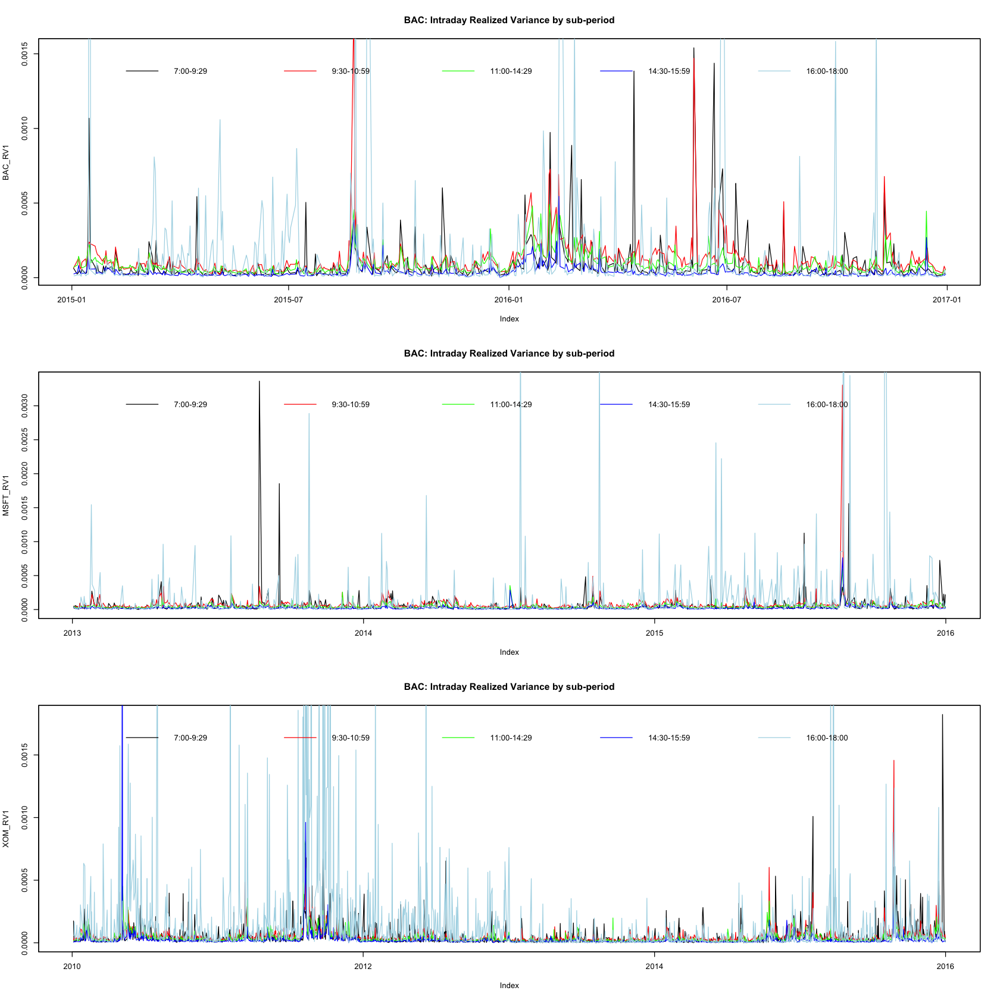

In [ ]:
options(repr.plot.height=14, repr.plot.width=14)
par(mfrow=c(3,1))

#BAC
plot.zoo(BAC_RV1, main="BAC: Intraday Realized Variance by sub-period")
lines(zoo(BAC_RV2), col="red")
lines(zoo(BAC_RV3), col="green")
lines(zoo(BAC_RV4), col="blue")
lines(zoo(BAC_RV5), col="lightblue")
legend(x="top", legend=c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00"),
    col=c("black", "red", "green", "blue", "lightblue"), lwd=1, bty="n", horiz=TRUE)

#MSFT
plot.zoo(MSFT_RV1, main="MSFT: Intraday Realized Variance by sub-period")
lines(zoo(MSFT_RV2), col="red")
lines(zoo(MSFT_RV3), col="#0ad00a")
lines(zoo(MSFT_RV4), col="blue")
lines(zoo(MSFT_RV5), col="lightblue")
legend(x="top", legend=c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00"),
    col=c("black", "red", "green", "blue", "lightblue"), lwd=1, bty="n", horiz=TRUE)

#XOM
plot.zoo(XOM_RV1, main="XOM: Intraday Realized Variance by sub-period")
lines(zoo(XOM_RV2), col="red")
lines(zoo(XOM_RV3), col="green")
lines(zoo(XOM_RV4), col="blue")
lines(zoo(XOM_RV5), col="lightblue")
legend(x="top", legend=c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00"),
    col=c("black", "red", "green", "blue", "lightblue"), lwd=1, bty="n", horiz=TRUE)

`COMMENT`

### 4. Daily RV vs Sum or Intraday RV

In [181]:
#BAC: difference in daily vs sum of intraday RV
BAC_daily_RV <- rCov(BAC_ret, makeReturns=FALSE) #make daily RV
index(BAC_daily_RV) <- as.Date(index(BAC_daily_RV)) #to keep only the date, no timestamp -> align all series

index(BAC_RV1) <- as.Date(index(BAC_RV1)) #drop timestamps for all - only dates left
index(BAC_RV2) <- as.Date(index(BAC_RV2))
index(BAC_RV3) <- as.Date(index(BAC_RV3))
index(BAC_RV4) <- as.Date(index(BAC_RV4))
index(BAC_RV5) <- as.Date(index(BAC_RV5))
BAC_RV_sum <- BAC_RV1 + BAC_RV2 + BAC_RV3 + BAC_RV4 + BAC_RV5 


#MSFT
MSFT_daily_RV <- rCov(MSFT_ret, makeReturns=FALSE)
index(MSFT_daily_RV) <- as.Date(index(MSFT_daily_RV))

index(MSFT_RV1) <- as.Date(index(MSFT_RV1)) 
index(MSFT_RV2) <- as.Date(index(MSFT_RV2))
index(MSFT_RV3) <- as.Date(index(MSFT_RV3))
index(MSFT_RV4) <- as.Date(index(MSFT_RV4))
index(MSFT_RV5) <- as.Date(index(MSFT_RV5))
MSFT_RV_sum <- MSFT_RV1 + MSFT_RV2 + MSFT_RV3 + MSFT_RV4 + MSFT_RV5


#XOM
XOM_daily_RV <- rCov(XOM_ret, makeReturns=FALSE)
index(XOM_daily_RV) <- as.Date(index(XOM_daily_RV))

index(XOM_RV1) <- as.Date(index(XOM_RV1)) 
index(XOM_RV2) <- as.Date(index(XOM_RV2))
index(XOM_RV3) <- as.Date(index(XOM_RV3))
index(XOM_RV4) <- as.Date(index(XOM_RV4))
index(XOM_RV5) <- as.Date(index(XOM_RV5))
XOM_RV_sum <- XOM_RV1 + XOM_RV2 + XOM_RV3 + XOM_RV4 + XOM_RV5

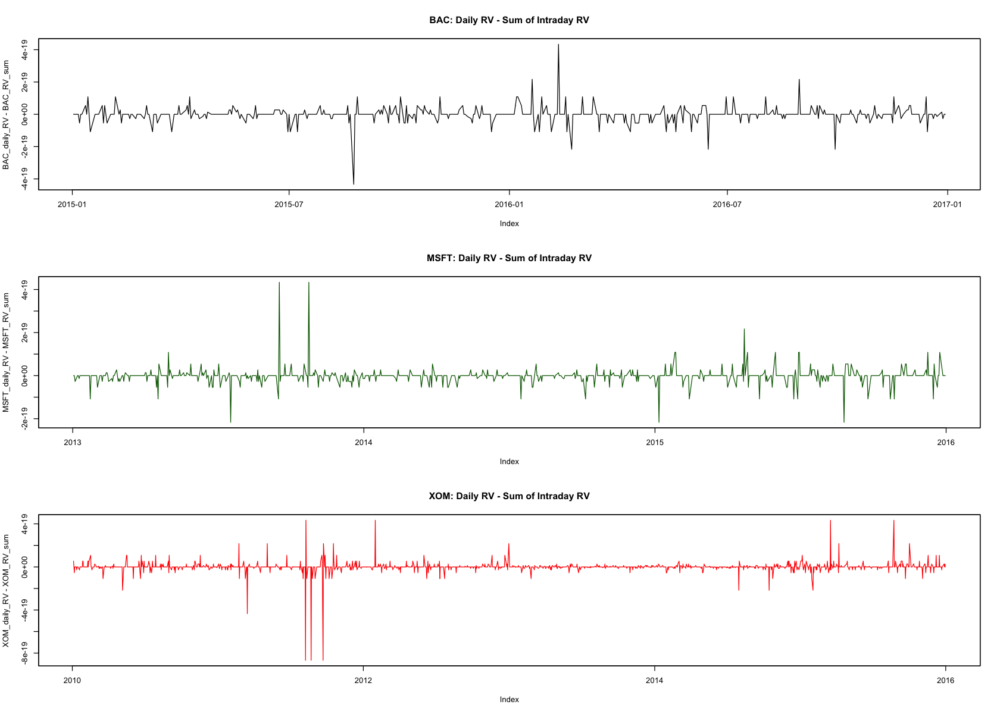

In [184]:
options(repr.plot.height=10, repr.plot.width=14)
par(mfrow=c(3,1))
plot.zoo(BAC_daily_RV - BAC_RV_sum, main="BAC: Daily RV - Sum of Intraday RV")
plot.zoo(MSFT_daily_RV - MSFT_RV_sum, main="MSFT: Daily RV - Sum of Intraday RV", col="darkgreen")
plot.zoo(XOM_daily_RV - XOM_RV_sum, main="XOM: Daily RV - Sum of Intraday RV", col="red")

`COMMENT`: Scale is basially 0. Floating point noise?

### 5. % share of individual intraday RV

In [185]:
BAC_pct1 <- BAC_RV1 / BAC_daily_RV * 100
BAC_pct2 <- BAC_RV2 / BAC_daily_RV * 100
BAC_pct3 <- BAC_RV3 / BAC_daily_RV * 100
BAC_pct4 <- BAC_RV4 / BAC_daily_RV * 100
BAC_pct5 <- BAC_RV5 / BAC_daily_RV * 100

MSFT_pct1 <- MSFT_RV1 / MSFT_daily_RV * 100
MSFT_pct2 <- MSFT_RV2 / MSFT_daily_RV * 100
MSFT_pct3 <- MSFT_RV3 / MSFT_daily_RV * 100
MSFT_pct4 <- MSFT_RV4 / MSFT_daily_RV * 100
MSFT_pct5 <- MSFT_RV5 / MSFT_daily_RV * 100

XOM_pct1 <- XOM_RV1 / XOM_daily_RV * 100
XOM_pct2 <- XOM_RV2 / XOM_daily_RV * 100
XOM_pct3 <- XOM_RV3 / XOM_daily_RV * 100
XOM_pct4 <- XOM_RV4 / XOM_daily_RV * 100
XOM_pct5 <- XOM_RV5 / XOM_daily_RV * 100

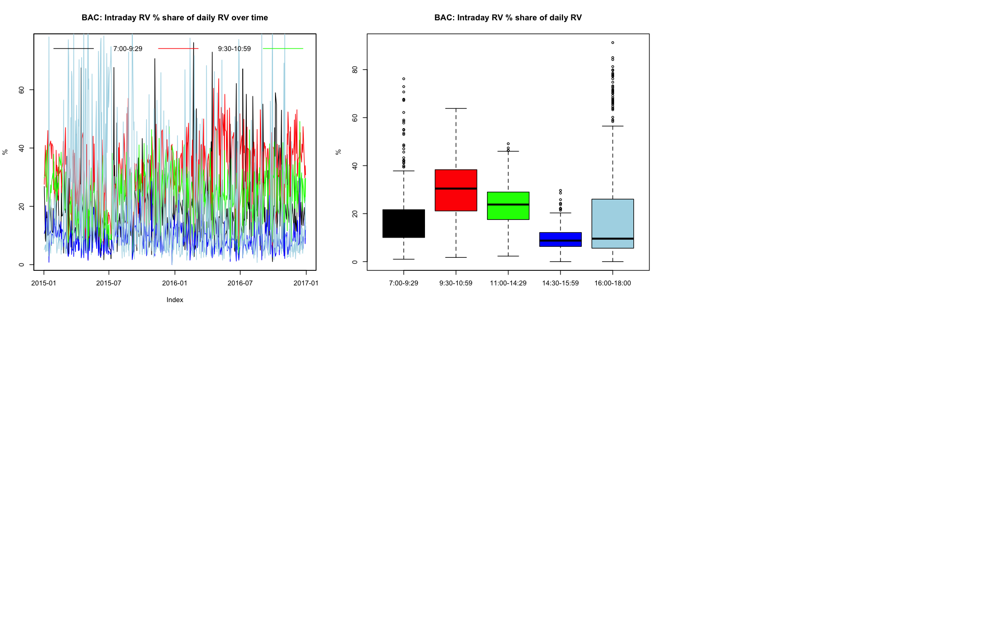

In [262]:
options(repr.plot.height=10, repr.plot.width=16)
par(mfrow=c(2,3))

plot.zoo(BAC_pct1, main="BAC: Intraday RV % share of daily RV over time", ylab="%") #to visualise variation over time, although hard to read
lines(zoo(BAC_pct2), col="red")
lines(zoo(BAC_pct3), col="green")
lines(zoo(BAC_pct4), col="blue")
lines(zoo(BAC_pct5), col="lightblue")
legend(x="topleft", legend=c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00"),
    col=c("black", "red", "green", "blue", "lightblue"), lwd=1, bty="n", horiz=TRUE, text.width=70)

BAC_pct_df <- data.frame( #prepare dataframe for boxplot
    "7:00-9:29" = as.numeric(BAC_pct1),
    "9:30-10:59" = as.numeric(BAC_pct2),
    "11:00-14:29" = as.numeric(BAC_pct3),
    "14:30-15:59" = as.numeric(BAC_pct4),
    "16:00-18:00" = as.numeric(BAC_pct5),
    check.names=FALSE)
boxplot(BAC_pct_df, main="BAC: Intraday RV % share of daily RV", ylab="%",
    col=c("black", "red", "green", "blue", "lightblue"))

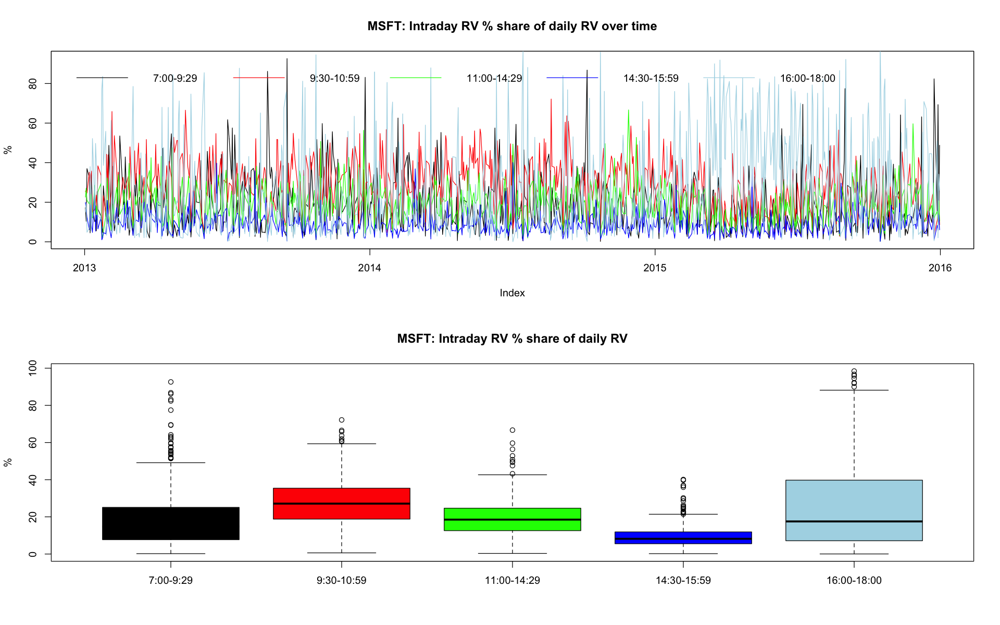

In [226]:
#same procedure for MSFT with a small tweak for df alignment
par(mfrow=c(2,1))

plot.zoo(MSFT_pct1, main="MSFT: Intraday RV % share of daily RV over time", ylab="%")
lines(zoo(MSFT_pct2), col="red")
lines(zoo(MSFT_pct3), col="green")
lines(zoo(MSFT_pct4), col="blue")
lines(zoo(MSFT_pct5), col="lightblue")
legend(x="topleft", legend=c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00"),
    col=c("black", "red", "green", "blue", "lightblue"), lwd=1, bty="n", horiz=TRUE, text.width=70
)

#need to merge MSFT pcts first, because pct5 has different number of obs than the rest (754 vs 756)
MSFT_pct_merged <- cbind(MSFT_pct1, MSFT_pct2, MSFT_pct3, MSFT_pct4, MSFT_pct5)
MSFT_pct_df <- as.data.frame(MSFT_pct_merged)
colnames(MSFT_pct_df) <- c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00")

boxplot(MSFT_pct_df, main="MSFT: Intraday RV % share of daily RV", ylab="%",
    col=c("black", "red", "green", "blue", "lightblue"))

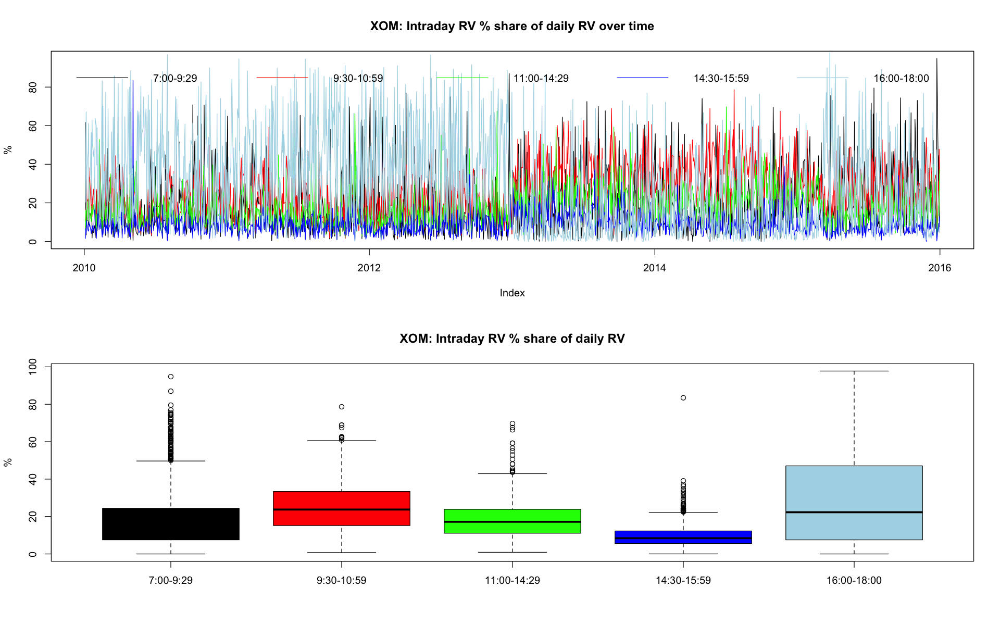

In [233]:
#XOM: same treatment as MSFT
par(mfrow=c(2,1))

plot.zoo(XOM_pct1, main="XOM: Intraday RV % share of daily RV over time", ylab="%")
lines(zoo(XOM_pct2), col="red")
lines(zoo(XOM_pct3), col="green")
lines(zoo(XOM_pct4), col="blue")
lines(zoo(XOM_pct5), col="lightblue")
legend(x="topleft", legend=c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00"),
    col=c("black", "red", "green", "blue", "lightblue"), lwd=1, bty="n", horiz=TRUE, text.width=200
)

XOM_pct_merged <- cbind(XOM_pct1, XOM_pct2, XOM_pct3, XOM_pct4, XOM_pct5)
XOM_pct_df <- as.data.frame(XOM_pct_merged)
colnames(XOM_pct_df) <- c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00")

boxplot(XOM_pct_df, main="XOM: Intraday RV % share of daily RV", ylab="%",
    col=c("black", "red", "green", "blue", "lightblue"))

`COMMENT` :coincides with triple witching hour?

### 6. RV using 1-minute prices

Previously when we computed RV over subperiods, we used pre-computed intraday returns (over the whole day) and segmented them by subperiods. As such, until this point, we are unaware whether every sub-period of interest contains enough price observations to calculate returns from within each sub-period.

Now however, we are using prices directly. Thus, we need to ensure that every sub-period contains enough price observations within itself to calculate returns.

If this is not dealt with, rCov causes `subscript out of bounds` error.

In [247]:
#We would like to see whether each sub-period has enough price observations to create a return

stocks <- list(BAC=BAC_xts, MSFT=MSFT_xts, XOM=XOM_xts) #list of stock prices
period_list <- list(c("07:00:00","09:29:00"), c("09:30:00","10:59:00"), #list of intraday periods
                    c("11:00:00","14:29:00"), c("14:30:00","15:59:00"),c("16:00:00","18:00:00"))

for (ticker in names(stocks)){
    for (i in 1:5){ #for each intraday period
        filtered <- filter_hours(stocks[[ticker]], period_list[[i]][1], period_list[[i]][2]) #custom function from earlier - xts subsetting for each intraday period
        obs_per_day <- table(as.Date(index(filtered))) #count how many observations we have each day
        single_obs_days <- sum(obs_per_day==1) #count number of days have a single price obs
        if (single_obs_days>0) cat(ticker, "period", i, "has", single_obs_days, "days with 1 price obs.\n")
    }
}


MSFT period 4 has 2 days with 1 price obs.
MSFT period 5 has 3 days with 1 price obs.
XOM period 1 has 9 days with 1 price obs.
XOM period 5 has 5 days with 1 price obs.


In [ ]:
#create a function which would remove days with insufficient price obs -> can calculate returns

filter_min_obs <- function(data, start, end, min_obs=2){
    filtered <- filter_hours(data, start, end)
    obs_per_day <- table(as.Date(index(filtered)))
    valid_days <- names(obs_per_day[obs_per_day >= min_obs]) #get the names (the dates) of days satisfying the min obs condition
    filtered[as.Date(index(filtered)) %in% as.Date(valid_days)] #subset 'filtered' to keep only observations from valid_days
}

In [ ]:
# BAC: intraday RV from prices
BAC_price_RV1 <- rCov(filter_min_obs(BAC_xts, "07:00:00", "09:29:00"), makeReturns=TRUE) #use only valid days
BAC_price_RV2 <- rCov(filter_min_obs(BAC_xts, "09:30:00", "10:59:00"), makeReturns=TRUE)
BAC_price_RV3 <- rCov(filter_min_obs(BAC_xts, "11:00:00", "14:29:00"), makeReturns=TRUE)
BAC_price_RV4 <- rCov(filter_min_obs(BAC_xts, "14:30:00", "15:59:00"), makeReturns=TRUE)
BAC_price_RV5 <- rCov(filter_min_obs(BAC_xts, "16:00:00", "18:00:00"), makeReturns=TRUE)

# MSFT
MSFT_price_RV1 <- rCov(filter_min_obs(MSFT_xts, "07:00:00", "09:29:00"), makeReturns=TRUE)
MSFT_price_RV2 <- rCov(filter_min_obs(MSFT_xts, "09:30:00", "10:59:00"), makeReturns=TRUE)
MSFT_price_RV3 <- rCov(filter_min_obs(MSFT_xts, "11:00:00", "14:29:00"), makeReturns=TRUE)
MSFT_price_RV4 <- rCov(filter_min_obs(MSFT_xts, "14:30:00", "15:59:00"), makeReturns=TRUE)
MSFT_price_RV5 <- rCov(filter_min_obs(MSFT_xts, "16:00:00", "18:00:00"), makeReturns=TRUE)

# XOM
XOM_price_RV1 <- rCov(filter_min_obs(XOM_xts, "07:00:00", "09:29:00"), makeReturns=TRUE)
XOM_price_RV2 <- rCov(filter_min_obs(XOM_xts, "09:30:00", "10:59:00"), makeReturns=TRUE)
XOM_price_RV3 <- rCov(filter_min_obs(XOM_xts, "11:00:00", "14:29:00"), makeReturns=TRUE)
XOM_price_RV4 <- rCov(filter_min_obs(XOM_xts, "14:30:00", "15:59:00"), makeReturns=TRUE)
XOM_price_RV5 <- rCov(filter_min_obs(XOM_xts, "16:00:00", "18:00:00"), makeReturns=TRUE)

In [254]:
head(BAC_price_RV1, 1)

Warning message:
"object timezone ('UTC') is different from system timezone ('')"


                            [,1]
2015-01-02 09:29:00 6.363873e-05

In [255]:
#keep only the date
index(BAC_price_RV1) <- as.Date(index(BAC_price_RV1))
index(BAC_price_RV2) <- as.Date(index(BAC_price_RV2))
index(BAC_price_RV3) <- as.Date(index(BAC_price_RV3))
index(BAC_price_RV4) <- as.Date(index(BAC_price_RV4))
index(BAC_price_RV5) <- as.Date(index(BAC_price_RV5))

index(MSFT_price_RV1) <- as.Date(index(MSFT_price_RV1))
index(MSFT_price_RV2) <- as.Date(index(MSFT_price_RV2))
index(MSFT_price_RV3) <- as.Date(index(MSFT_price_RV3))
index(MSFT_price_RV4) <- as.Date(index(MSFT_price_RV4))
index(MSFT_price_RV5) <- as.Date(index(MSFT_price_RV5))

index(XOM_price_RV1) <- as.Date(index(XOM_price_RV1))
index(XOM_price_RV2) <- as.Date(index(XOM_price_RV2))
index(XOM_price_RV3) <- as.Date(index(XOM_price_RV3))
index(XOM_price_RV4) <- as.Date(index(XOM_price_RV4))
index(XOM_price_RV5) <- as.Date(index(XOM_price_RV5))

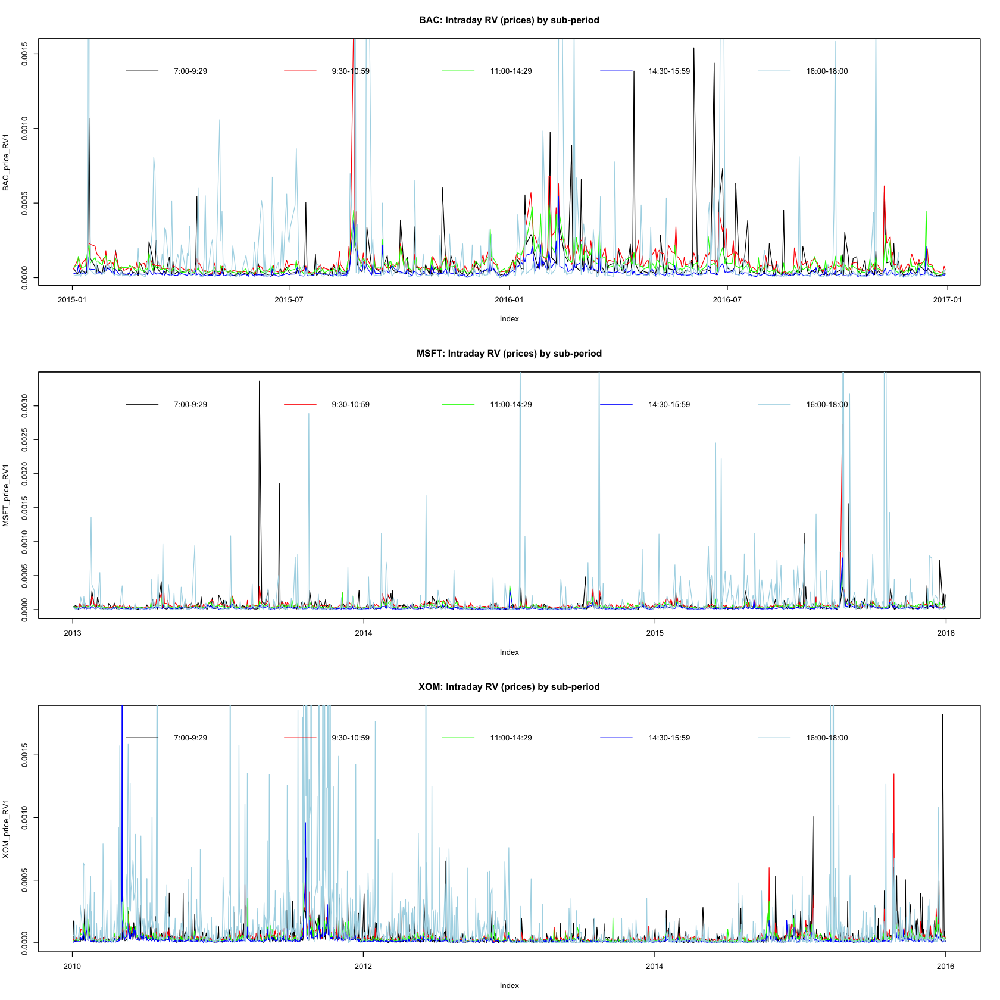

In [256]:
#plots
options(repr.plot.height=14, repr.plot.width=14)
par(mfrow=c(3,1))

plot.zoo(BAC_price_RV1, main="BAC: Intraday RV (prices) by sub-period")
lines(zoo(BAC_price_RV2), col="red")
lines(zoo(BAC_price_RV3), col="green")
lines(zoo(BAC_price_RV4), col="blue")
lines(zoo(BAC_price_RV5), col="lightblue")
legend(x="top", legend=c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00"),
       col=c("black","red","green","blue","lightblue"), lwd=1, bty="n", horiz=TRUE)

plot.zoo(MSFT_price_RV1, main="MSFT: Intraday RV (prices) by sub-period")
lines(zoo(MSFT_price_RV2), col="red")
lines(zoo(MSFT_price_RV3), col="green")
lines(zoo(MSFT_price_RV4), col="blue")
lines(zoo(MSFT_price_RV5), col="lightblue")
legend(x="top", legend=c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00"),
       col=c("black","red","green","blue","lightblue"), lwd=1, bty="n", horiz=TRUE)

plot.zoo(XOM_price_RV1, main="XOM: Intraday RV (prices) by sub-period")
lines(zoo(XOM_price_RV2), col="red")
lines(zoo(XOM_price_RV3), col="green")
lines(zoo(XOM_price_RV4), col="blue")
lines(zoo(XOM_price_RV5), col="lightblue")
legend(x="top", legend=c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00"),
       col=c("black","red","green","blue","lightblue"), lwd=1, bty="n", horiz=TRUE)

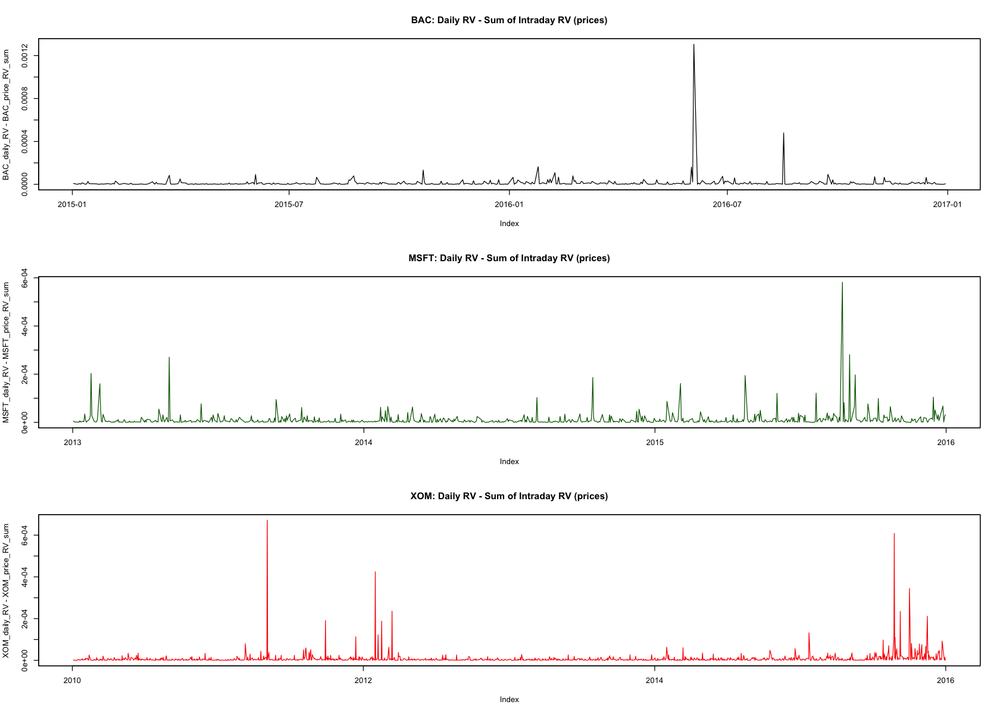

In [ ]:
#difference between daily RV and sum of intraday RV

#sub-period sum of RV
BAC_price_RV_sum <- BAC_price_RV1 + BAC_price_RV2 + BAC_price_RV3 + BAC_price_RV4 + BAC_price_RV5
MSFT_price_RV_sum <- MSFT_price_RV1 + MSFT_price_RV2 + MSFT_price_RV3 + MSFT_price_RV4 + MSFT_price_RV5
XOM_price_RV_sum <- XOM_price_RV1 + XOM_price_RV2 + XOM_price_RV3 + XOM_price_RV4 + XOM_price_RV5

options(repr.plot.height=10, repr.plot.width=14)
par(mfrow=c(3,1))
plot.zoo(BAC_daily_RV-BAC_price_RV_sum, main="BAC: Daily RV - Sum of Intraday RV (prices)")
plot.zoo(MSFT_daily_RV-MSFT_price_RV_sum, main="MSFT: Daily RV - Sum of Intraday RV (prices)", col="darkgreen")
plot.zoo(XOM_daily_RV-XOM_price_RV_sum, main="XOM: Daily RV - Sum of Intraday RV (prices)", col="red")

In [258]:
#percentage share of individual intraday RV on total daily RV

BAC_price_pct1 <- BAC_price_RV1 / BAC_daily_RV * 100
BAC_price_pct2 <- BAC_price_RV2 / BAC_daily_RV * 100
BAC_price_pct3 <- BAC_price_RV3 / BAC_daily_RV * 100
BAC_price_pct4 <- BAC_price_RV4 / BAC_daily_RV * 100
BAC_price_pct5 <- BAC_price_RV5 / BAC_daily_RV * 100

MSFT_price_pct1 <- MSFT_price_RV1 / MSFT_daily_RV * 100
MSFT_price_pct2 <- MSFT_price_RV2 / MSFT_daily_RV * 100
MSFT_price_pct3 <- MSFT_price_RV3 / MSFT_daily_RV * 100
MSFT_price_pct4 <- MSFT_price_RV4 / MSFT_daily_RV * 100
MSFT_price_pct5 <- MSFT_price_RV5 / MSFT_daily_RV * 100

XOM_price_pct1 <- XOM_price_RV1 / XOM_daily_RV * 100
XOM_price_pct2 <- XOM_price_RV2 / XOM_daily_RV * 100
XOM_price_pct3 <- XOM_price_RV3 / XOM_daily_RV * 100
XOM_price_pct4 <- XOM_price_RV4 / XOM_daily_RV * 100
XOM_price_pct5 <- XOM_price_RV5 / XOM_daily_RV * 100

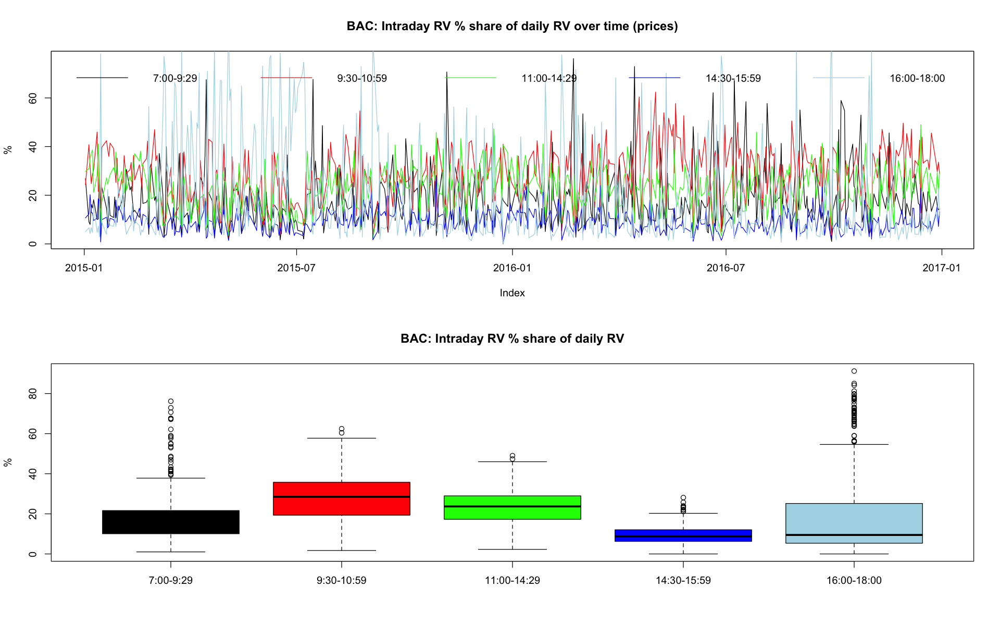

In [259]:
options(repr.plot.height=10, repr.plot.width=16)
par(mfrow=c(2,1))

plot.zoo(BAC_price_pct1, main="BAC: Intraday RV % share of daily RV over time (prices)", ylab="%")
lines(zoo(BAC_price_pct2), col="red")
lines(zoo(BAC_price_pct3), col="green")
lines(zoo(BAC_price_pct4), col="blue")
lines(zoo(BAC_price_pct5), col="lightblue")
legend(x="topleft", legend=c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00"),
    col=c("black", "red", "green", "blue", "lightblue"), lwd=1, bty="n", horiz=TRUE, text.width=70)

BAC_pct_df <- data.frame(
    "7:00-9:29" = as.numeric(BAC_price_pct1),
    "9:30-10:59" = as.numeric(BAC_price_pct2),
    "11:00-14:29" = as.numeric(BAC_price_pct3),
    "14:30-15:59" = as.numeric(BAC_price_pct4),
    "16:00-18:00" = as.numeric(BAC_price_pct5),
    check.names=FALSE)
boxplot(BAC_pct_df, main="BAC: Intraday RV % share of daily RV", ylab="%",
    col=c("black", "red", "green", "blue", "lightblue"))

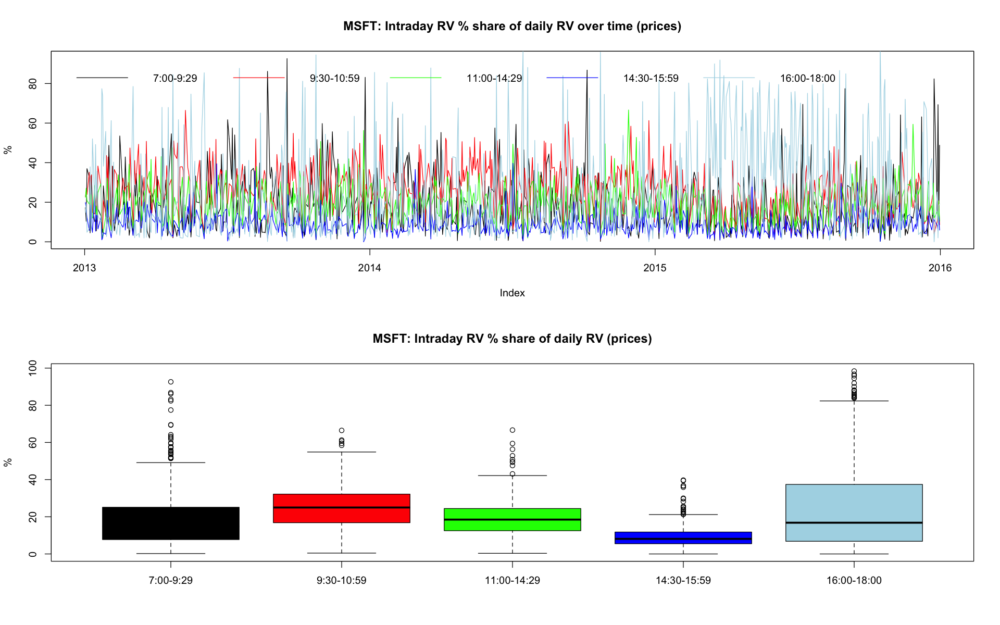

In [264]:
#MSFT
par(mfrow=c(2,1))

plot.zoo(MSFT_price_pct1, main="MSFT: Intraday RV % share of daily RV over time (prices)", ylab="%")
lines(zoo(MSFT_price_pct2), col="red")
lines(zoo(MSFT_price_pct3), col="green")
lines(zoo(MSFT_price_pct4), col="blue")
lines(zoo(MSFT_price_pct5), col="lightblue")
legend(x="topleft", legend=c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00"),
    col=c("black", "red", "green", "blue", "lightblue"), lwd=1, bty="n", horiz=TRUE, text.width=70
)


#same treatment as in task 7
MSFT_price_pct_merged <- cbind(MSFT_price_pct1, MSFT_price_pct2, MSFT_price_pct3, MSFT_price_pct4, MSFT_price_pct5)
MSFT_price_pct_df <- as.data.frame(MSFT_price_pct_merged)
colnames(MSFT_price_pct_df) <- c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00")

boxplot(MSFT_price_pct_df, main="MSFT: Intraday RV % share of daily RV (prices)", ylab="%",
    col=c("black", "red", "green", "blue", "lightblue"))

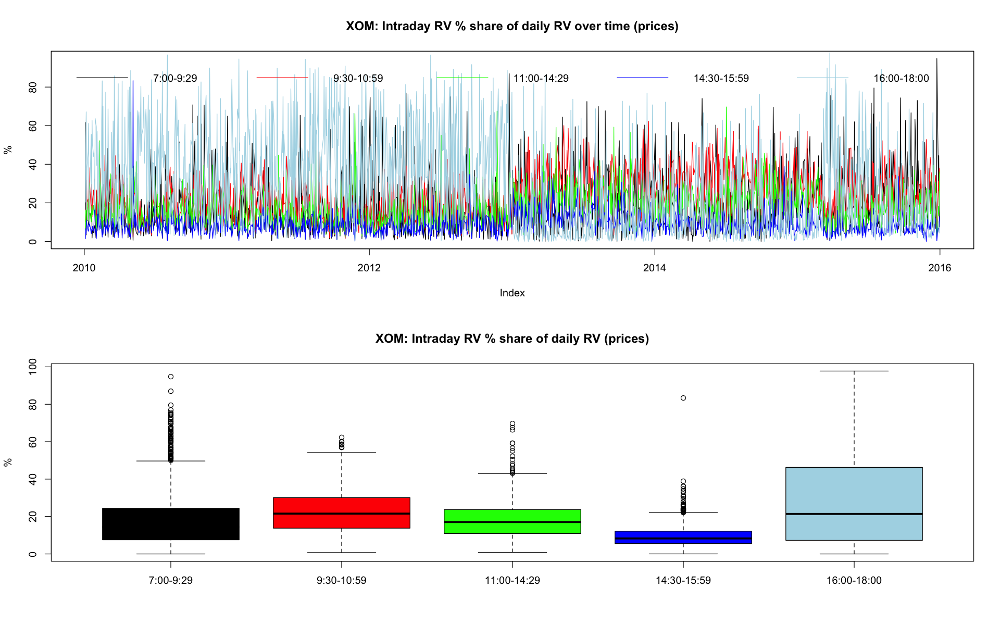

In [ ]:
#XOM
par(mfrow=c(2,1))

plot.zoo(XOM_price_pct1, main="XOM: Intraday RV % share of daily RV over time (prices)", ylab="%")
lines(zoo(XOM_price_pct2), col="red")
lines(zoo(XOM_price_pct3), col="green")
lines(zoo(XOM_price_pct4), col="blue")
lines(zoo(XOM_price_pct5), col="lightblue")
legend(x="topleft", legend=c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00"),
    col=c("black", "red", "green", "blue", "lightblue"), lwd=1, bty="n", horiz=TRUE, text.width=200
)

XOM_price_pct_merged <- cbind(XOM_price_pct1, XOM_price_pct2, XOM_price_pct3, XOM_price_pct4, XOM_price_pct5)
XOM_price_pct_df <- as.data.frame(XOM_price_pct_merged)
colnames(XOM_price_pct_df) <- c("7:00-9:29", "9:30-10:59", "11:00-14:29", "14:30-15:59", "16:00-18:00")

boxplot(XOM_price_pct_df, main="XOM: Intraday RV % share of daily RV (prices)", ylab="%",
    col=c("black", "red", "green", "blue", "lightblue"))

### 7. BPV and MedRV comparison to RV

Here we assume the assignment does not ask for computation of the noise-robust BPV because we will compare the differences from microstructure noise between 1 and 5-minute data in Problem 2.

In [270]:
#BPV from 1min prices (full day)
BAC_BPV <- rBPCov(rData=BAC_xts, makeReturns=TRUE)
MSFT_BPV <- rBPCov(rData=MSFT_xts, makeReturns=TRUE)
XOM_BPV <- rBPCov(rData=XOM_xts, makeReturns=TRUE)

#MedRV from 1min prices (full day)
BAC_MedRV <- rMedRVar(rData=BAC_xts, makeReturns=TRUE)
MSFT_MedRV <- rMedRVar(rData=MSFT_xts, makeReturns=TRUE)
XOM_MedRV <- rMedRVar(rData=XOM_xts, makeReturns=TRUE)


#reindex for alignment purposes (ex. BAC_daily_RV - BAC_BPV): drop timestamp
index(BAC_BPV) <- as.Date(index(BAC_BPV))
index(MSFT_BPV) <- as.Date(index(MSFT_BPV))
index(XOM_BPV) <- as.Date(index(XOM_BPV))

index(BAC_MedRV) <- as.Date(index(BAC_MedRV))
index(MSFT_MedRV) <- as.Date(index(MSFT_MedRV))
index(XOM_MedRV) <- as.Date(index(XOM_MedRV))

In [ ]:
#testing for jumps (JT = jump test)
#BPV
BAC_BPV_JT <- BNSjumpTest(BAC_xts, IVestimator="BV", IQestimator="TP", makeReturns=TRUE)
MSFT_BPV_JT <- BNSjumpTest(MSFT_xts, IVestimator="BV", IQestimator="TP", makeReturns=TRUE)
XOM_BPV_JT <- BNSjumpTest(XOM_xts, IVestimator="BV", IQestimator="TP", makeReturns=TRUE)


#MedRV
BAC_MedRV_JT <- BNSjumpTest(BAC_xts, IVestimator="rMedRVar", IQestimator="rMedRQuar", makeReturns=TRUE)
MSFT_MedRV_JT <- BNSjumpTest(MSFT_xts, IVestimator="rMedRVar", IQestimator="rMedRQuar", makeReturns=TRUE)
XOM_MedRV_JT <- BNSjumpTest(XOM_xts, IVestimator="rMedRVar", IQestimator="rMedRQuar", makeReturns=TRUE)

In [ ]:
#head(BAC_MedRV_JT, 3)

Warning message:
"object timezone ('UTC') is different from system timezone ('')"


                         ztest     lower    upper   p.value
2015-01-02 17:59:00 -0.2746027 -1.959964 1.959964 0.7836215
2015-01-05 18:00:00 -0.2355024 -1.959964 1.959964 0.8138188
2015-01-06 17:59:00  0.3255803 -1.959964 1.959964 0.7447419
                    universalThresholdLower universalThresholdUpper
2015-01-02 17:59:00               -2.384804                2.384804
2015-01-05 18:00:00               -2.384804                2.384804
2015-01-06 17:59:00               -2.384804                2.384804

In [289]:
#create a jump indicator I (1 = signif. jump, 0 = not)
#BPV
BAC_BPV_I <- BAC_BPV_JT[, "p.value"] < 0.05 #take the signif p-values
MSFT_BPV_I <- MSFT_BPV_JT[, "p.value"] < 0.05
XOM_BPV_I <- XOM_BPV_JT[, "p.value"] < 0.05

index(BAC_BPV_I) <- as.Date(index(BAC_BPV_I)) #drop the timestamp - needed for difference step (identific of jumps)
index(MSFT_BPV_I) <- as.Date(index(MSFT_BPV_I))
index(XOM_BPV_I) <- as.Date(index(XOM_BPV_I))

#MedRV
BAC_MedRV_I <- BAC_MedRV_JT[, "p.value"] < 0.05
MSFT_MedRV_I <- MSFT_MedRV_JT[, "p.value"] < 0.05
XOM_MedRV_I <- XOM_MedRV_JT[, "p.value"] < 0.05

index(BAC_MedRV_I) <- as.Date(index(BAC_MedRV_I))
index(MSFT_MedRV_I) <- as.Date(index(MSFT_MedRV_I))
index(XOM_MedRV_I) <- as.Date(index(XOM_MedRV_I))

In [ ]:
#identify significant jumps
#BVP
BAC_BPV_J <- (BAC_daily_RV - BAC_BPV) * BAC_BPV_I #xts of signif jump magnitude or 0s
MSFT_BPV_J <- (MSFT_daily_RV - MSFT_BPV) * MSFT_BPV_I
XOM_BPV_J <- (XOM_daily_RV - XOM_BPV) * XOM_BPV_I

#MedRV
BAC_MedRV_J <- (BAC_daily_RV - BAC_MedRV) * BAC_MedRV_I
MSFT_MedRV_J <- (MSFT_daily_RV - MSFT_MedRV) * MSFT_MedRV_I
XOM_MedRV_J <- (XOM_daily_RV - XOM_MedRV) * XOM_MedRV_I


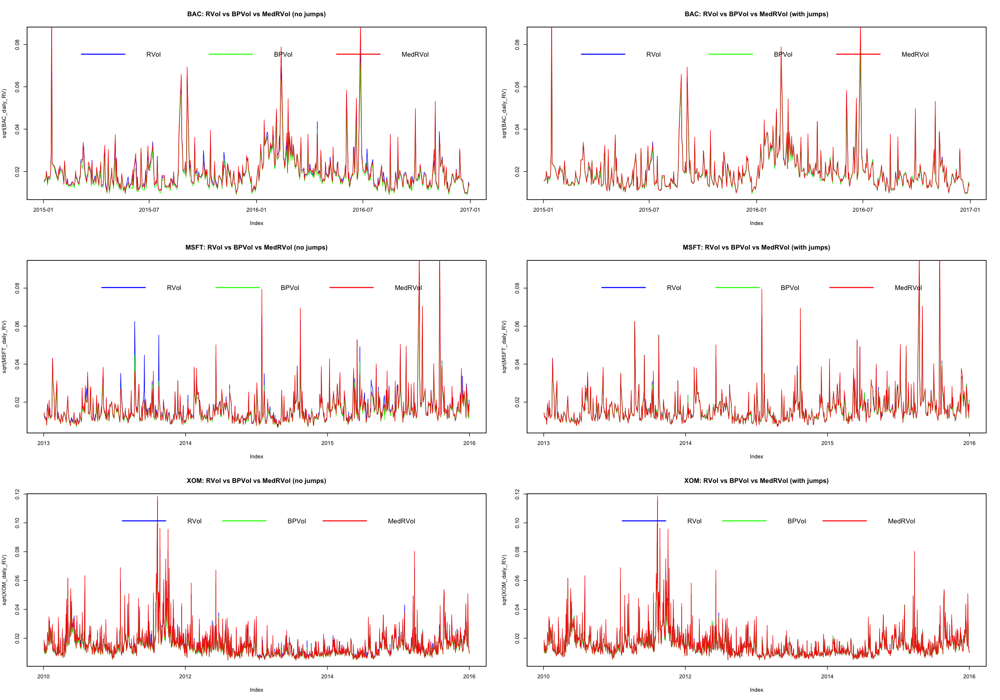

In [ ]:
#Comparison of RVolatility estimates (without jumps vs with jumps)
options(repr.plot.height=14, repr.plot.width=20)
par(mfrow=c(3,2))

# BAC
plot.zoo(sqrt(BAC_daily_RV), main="BAC: RVol vs BPVol vs MedRVol (no jumps)", col="blue")
lines(zoo(sqrt(BAC_BPV)), col="green")
lines(zoo(sqrt(BAC_MedRV)), col="red")
legend("top", legend=c("RVol", "BPVol", "MedRVol"), col=c("blue", "green", "red"),
    lwd=2, bty="n", horiz=TRUE, cex=1.2, text.width=70)

plot.zoo(sqrt(BAC_daily_RV), main="BAC: RVol vs BPVol vs MedRVol (with jumps)", col="blue")
lines(zoo(sqrt(BAC_BPV + BAC_BPV_J)), col="green")
lines(zoo(sqrt(BAC_MedRV + BAC_MedRV_J)), col="red")
legend("top", legend=c("RVol", "BPVol", "MedRVol"), col=c("blue", "green", "red"),
    lwd=2, bty="n", horiz=TRUE, cex=1.2, text.width=70)


# MSFT
plot.zoo(sqrt(MSFT_daily_RV), main="MSFT: RVol vs BPVol vs MedRVol (no jumps)", col="blue")
lines(zoo(sqrt(MSFT_BPV)), col="green")
lines(zoo(sqrt(MSFT_MedRV)), col="red")
legend("top", legend=c("RVol", "BPVol", "MedRVol"), col=c("blue", "green", "red"),
    lwd=2, bty="n", horiz=TRUE, cex=1.2, text.width=70)

plot.zoo(sqrt(MSFT_daily_RV), main="MSFT: RVol vs BPVol vs MedRVol (with jumps)", col="blue")
lines(zoo(sqrt(MSFT_BPV + MSFT_BPV_J)), col="green")
lines(zoo(sqrt(MSFT_MedRV + MSFT_MedRV_J)), col="red")
legend("top", legend=c("RVol", "BPVol", "MedRVol"), col=c("blue", "green", "red"),
    lwd=2, bty="n", horiz=TRUE, cex=1.2, text.width=70)


# XOM
plot.zoo(sqrt(XOM_daily_RV), main="XOM: RVol vs BPVol vs MedRVol (no jumps)", col="blue")
lines(zoo(sqrt(XOM_BPV)), col="green")
lines(zoo(sqrt(XOM_MedRV)), col="red")
legend("top", legend=c("RVol", "BPVol", "MedRVol"), col=c("blue", "green", "red"),
    lwd=2, bty="n", horiz=TRUE, cex=1.2, text.width=70)

plot.zoo(sqrt(XOM_daily_RV), main="XOM: RVol vs BPVol vs MedRVol (with jumps)", col="blue")
lines(zoo(sqrt(XOM_BPV + XOM_BPV_J)), col="green")
lines(zoo(sqrt(XOM_MedRV + XOM_MedRV_J)), col="red")
legend("top", legend=c("RVol", "BPVol", "MedRVol"), col=c("blue", "green", "red"),
    lwd=2, bty="n", horiz=TRUE, cex=1.2, text.width=70)

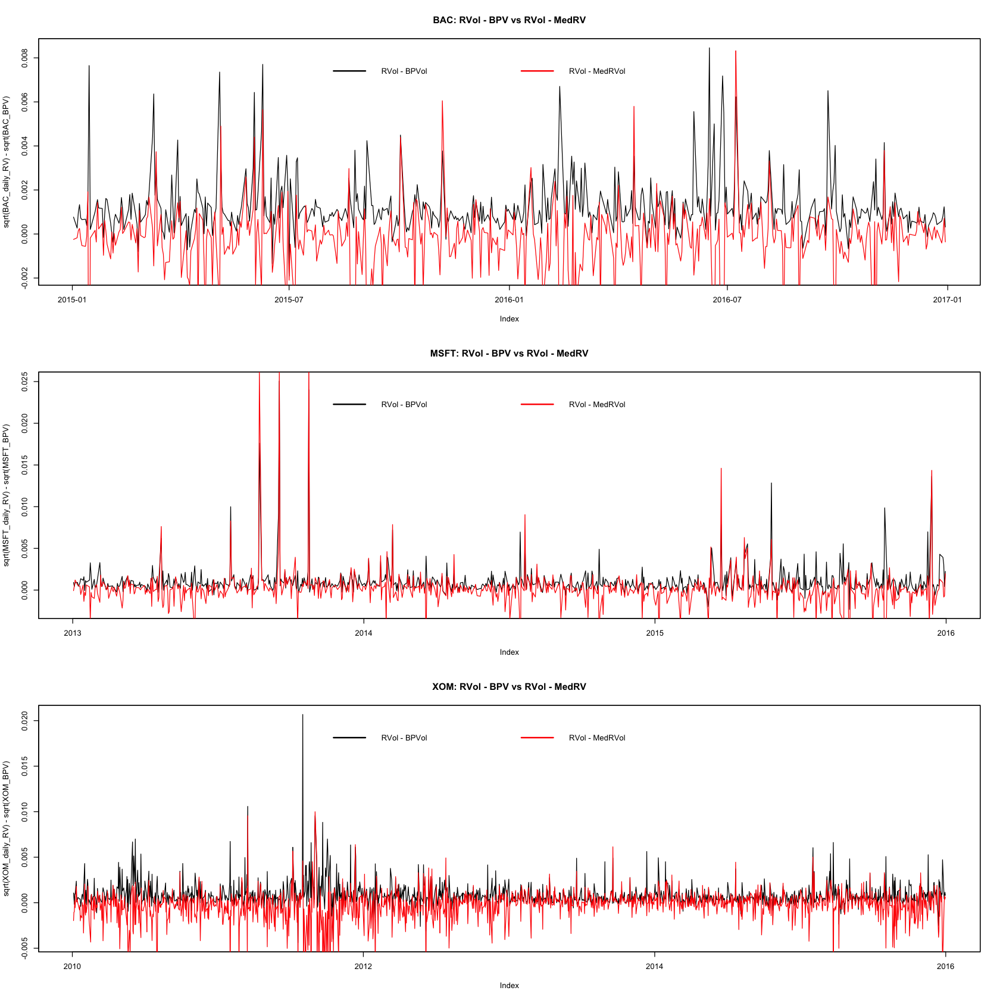

In [342]:
#Comparison of the differences: RVol - BPVol and RVol - MedVol
par(mfrow=c(3,1))

plot.zoo(sqrt(BAC_daily_RV) - sqrt(BAC_BPV), main="BAC: RVol - BPV vs RVol - MedRV")
lines(zoo(sqrt(BAC_daily_RV) - sqrt(BAC_MedRV)), col="red", lwd=1)
legend("top", legend=c("RVol - BPVol", "RVol - MedRVol"),
       col=c("black", "red"), lwd=2, bty="n", horiz=TRUE)

plot.zoo(sqrt(MSFT_daily_RV) - sqrt(MSFT_BPV), main="MSFT: RVol - BPV vs RVol - MedRV")
lines(zoo(sqrt(MSFT_daily_RV) - sqrt(MSFT_MedRV)), col="red", lwd=1)
legend("top", legend=c("RVol - BPVol", "RVol - MedRVol"),
       col=c("black", "red"), lwd=2, bty="n", horiz=TRUE)

plot.zoo(sqrt(XOM_daily_RV) - sqrt(XOM_BPV), main="XOM: RVol - BPV vs RVol - MedRV")
lines(zoo(sqrt(XOM_daily_RV) - sqrt(XOM_MedRV)), col="red", lwd=1)
legend("top", legend=c("RVol - BPVol", "RVol - MedRVol"),
       col=c("black", "red"), lwd=2, bty="n", horiz=TRUE)

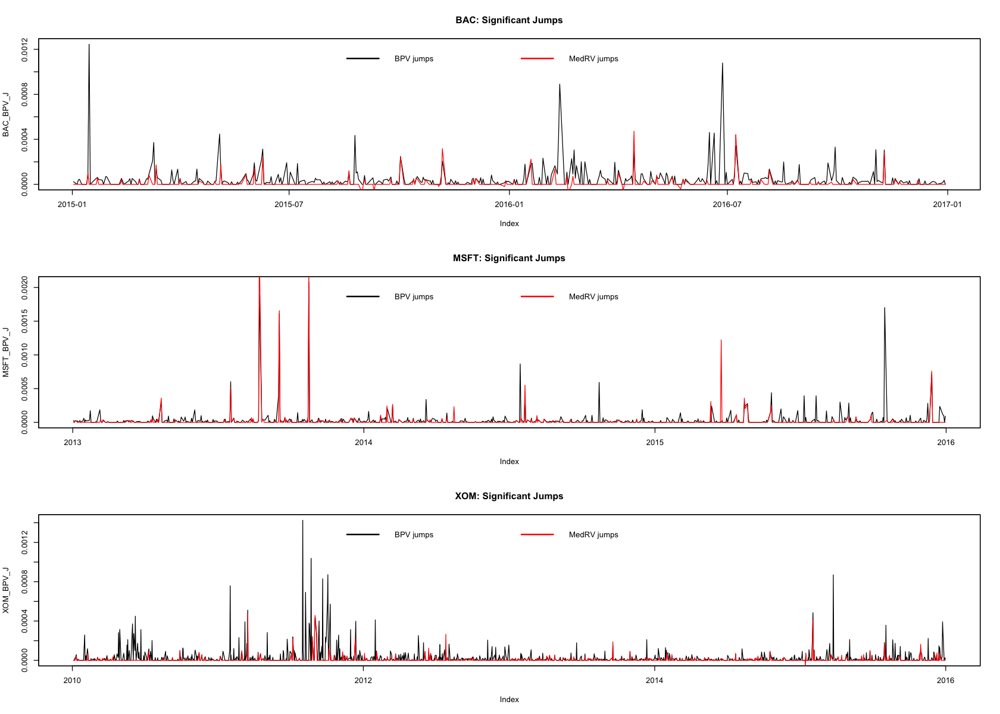

In [ ]:
#visualisation of significant jumps (variance scale)

par(mfrow=c(3,1))

plot.zoo(BAC_BPV_J, main="BAC: Significant Jumps")
lines(zoo(BAC_MedRV_J), col="red", lwd=1)
legend("top", legend=c("BPV jumps", "MedRV jumps"),
       col=c("black", "red"), lwd=2, bty="n", horiz=TRUE)

plot.zoo(MSFT_BPV_J, main="MSFT: Significant Jumps")
lines(zoo(MSFT_MedRV_J), col="red", lwd=1)
legend("top", legend=c("BPV jumps", "MedRV jumps"),
       col=c("black", "red"), lwd=2, bty="n", horiz=TRUE)

plot.zoo(XOM_BPV_J, main="XOM: Significant Jumps")
lines(zoo(XOM_MedRV_J), col="red", lwd=1)
legend("top", legend=c("BPV jumps", "MedRV jumps"),
       col=c("black", "red"), lwd=2, bty="n", horiz=TRUE)

### 8. ARMA(0,0)-GARCH(1,1)

In [366]:
#We calculate daily returns by summing intraday returns

BAC_daily_ret <- xts(unlist( #xts needs a vector
    lapply(split(BAC_ret, as.Date(index(BAC_ret))), sum)), #split returns per day and sum
    order.by=unique(as.Date(index(BAC_ret))) #order result by days, not intraday timestamps
)

MSFT_daily_ret <- xts(
    unlist(lapply(split(MSFT_ret, as.Date(index(MSFT_ret))), sum)), 
    order.by=unique(as.Date(index(MSFT_ret)))
)

XOM_daily_ret <- xts(
    unlist(lapply(split(XOM_ret, as.Date(index(XOM_ret))), sum)), 
    order.by=unique(as.Date(index(XOM_ret)))
)

head(BAC_daily_ret, 3)

                   [,1]
2015-01-02 -0.005023954
2015-01-05 -0.025532081
2015-01-06 -0.034293693

In [ ]:
#fitting the GARCH models
garchspec <- ugarchspec(
    mean.model=list(armaOrder=c(0,0)), 
    variance.model=list(garchOrder=c(1,1))
)

BAC_garch <- ugarchfit(garchspec, BAC_daily_ret)
MSFT_garch <- ugarchfit(garchspec, MSFT_daily_ret)
XOM_garch <- ugarchfit(garchspec, XOM_daily_ret)


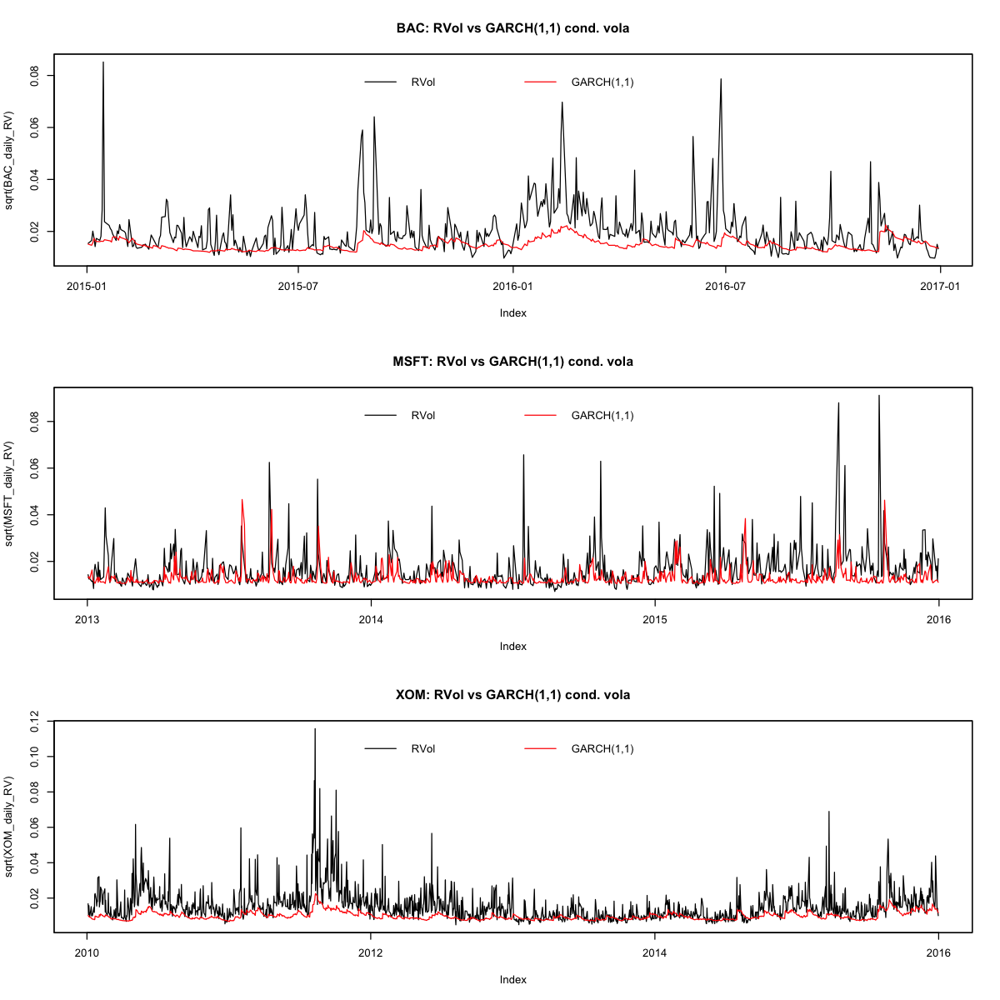

In [375]:
#plot daily RVol vs Sigma GARCH
options(repr.plot.height=10, repr.plot.width=10)
par(mfrow=c(3,1))

#BAC
plot.zoo(sqrt(BAC_daily_RV), main="BAC: RVol vs GARCH(1,1) cond. vola", col="black")
lines(zoo(sigma(BAC_garch)), col="red")
legend("top", legend=c("RVol", "GARCH(1,1)"), col=c("black", "red"), lwd=1, bty="n", horiz=TRUE)

#MSFT
plot.zoo(sqrt(MSFT_daily_RV), main="MSFT: RVol vs GARCH(1,1) cond. vola", col="black")
lines(zoo(sigma(MSFT_garch)), col="red")
legend("top", legend=c("RVol", "GARCH(1,1)"), col=c("black", "red"), lwd=1, bty="n", horiz=TRUE)

#XOM
plot.zoo(sqrt(XOM_daily_RV), main="XOM: RVol vs GARCH(1,1) cond. vola", col="black")
lines(zoo(sigma(XOM_garch)), col="red")
legend("top", legend=c("RVol", "GARCH(1,1)"), col=c("black", "red"), lwd=1, bty="n", horiz=TRUE)